# Radiomic analysis for ECR2024

In [2]:
import os
import sys
import re
import itertools
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns

from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import StandardScaler
from pathlib import Path
from IPython.display import *

# Add custom package
sys.path.append(str(Path("./").absolute()))
from feature_robustness_analysis.io import *
from feature_robustness_analysis.stats import *
from feature_robustness_analysis.plots import *

# basic configurations
mpl.style.use('ggplot')
mdprint = lambda x: display(Markdown(x))

In [3]:
# Load data
df_raw = pd.read_excel("./RadFeatures_raw_ECR2024.xlsx", index_col=0)
display(df_raw)

,LUNG1-027_R20,LUNG1-062_R20,LUNG1-061_R10,LUNG1-037_R20,LUNG1-027_R40,LUNG1-063_R40,LUNG1-007_R20,LUNG1-062_R40,LUNG1-013_R40,LUNG1-050_R10,...,LUNG1-331-A_R40,LUNG1-130-B_R10,LUNG1-019-A_R20,LUNG1-353-A_R40,LUNG1-072-A_R20,LUNG1-095-A_R10,LUNG1-095-A_R40,LUNG1-095-B_R10,LUNG1-130-A_R20,LUNG1-095-A_R20
diagnostics_Versions_PyRadiomics,v3.0.1,v3.0.1,v3.0.1,v3.0.1,v3.0.1,v3.0.1,v3.0.1,v3.0.1,v3.0.1,v3.0.1,...,v3.0.1,v3.0.1,v3.0.1,v3.0.1,v3.0.1,v3.0.1,v3.0.1,v3.0.1,v3.0.1,v3.0.1
diagnostics_Versions_Numpy,1.24.3,1.24.3,1.24.3,1.24.3,1.24.3,1.24.3,1.24.3,1.24.3,1.24.3,1.24.3,...,1.24.3,1.24.3,1.24.3,1.24.3,1.24.3,1.24.3,1.24.3,1.24.3,1.24.3,1.24.3
diagnostics_Versions_SimpleITK,2.2.1,2.2.1,2.2.1,2.2.1,2.2.1,2.2.1,2.2.1,2.2.1,2.2.1,2.2.1,...,2.2.1,2.2.1,2.2.1,2.2.1,2.2.1,2.2.1,2.2.1,2.2.1,2.2.1,2.2.1
diagnostics_Versions_PyWavelet,1.4.1,1.4.1,1.4.1,1.4.1,1.4.1,1.4.1,1.4.1,1.4.1,1.4.1,1.4.1,...,1.4.1,1.4.1,1.4.1,1.4.1,1.4.1,1.4.1,1.4.1,1.4.1,1.4.1,1.4.1
diagnostics_Versions_Python,3.8.16,3.8.16,3.8.16,3.8.16,3.8.16,3.8.16,3.8.16,3.8.16,3.8.16,3.8.16,...,3.8.16,3.8.16,3.8.16,3.8.16,3.8.16,3.8.16,3.8.16,3.8.16,3.8.16,3.8.16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
logarithm_ngtdm_Busyness,2.716674,3.749978,15.88008,9.381246,2.7976,14.817966,12.118757,2.802514,13.221865,7.207822,...,74.775158,48.003235,85.329542,50.217644,30.877627,69.359896,75.196451,12.48896,50.899048,87.630745
logarithm_ngtdm_Coarseness,0.012627,0.003217,0.002149,0.002073,0.011891,0.000768,0.001107,0.003225,0.000567,0.003024,...,0.000066,0.000228,0.000066,0.000112,0.000114,0.000031,0.000028,0.000599,0.000082,0.000026
logarithm_ngtdm_Complexity,25.047923,13.123111,17.013725,13.56335,25.659339,11.962933,12.737509,16.812701,22.711814,10.626472,...,32.215543,14.047689,31.27239,16.320369,59.646783,61.161013,65.458993,10.387315,25.444812,64.878139
logarithm_ngtdm_Contrast,0.177134,0.015235,0.075533,0.064278,0.172465,0.006678,0.035933,0.011995,0.016171,0.020888,...,0.00406,0.002322,0.007261,0.002932,0.010113,0.0011,0.001183,0.000591,0.003958,0.001395


In [4]:
def standardize_df(df: pd.DataFrame):
    r"""Standardize dataframe by changing the column and index"""
    ori_index = df.index
    ori_col = df.columns
    # regpat for columns
    regpat = "(?P<PID>LUNG1-\d+)-?(?P<LESSION_CODE>\w?)_(?P<ROT_DEG>R\d+)"    
    
    # Define new list 
    new_column = pd.MultiIndex.from_tuples(
        ["{PID},{LESSION_CODE},{ROT_DEG}".format(**re.search(regpat, s).groupdict()).split(',') for s in ori_col], 
        names=["PID", "LessionCode", "Rotation"]
    )
    new_index = pd.MultiIndex.from_tuples(
        [s.split("_") for s in ori_index], 
        names=["ImagingFilter", "Category", "Name"]
    )
    new_df = df.copy()
    new_df.index = new_index
    new_df.columns = new_column
    return new_df

df = standardize_df(df_raw)
df.sort_index(axis=0, inplace=True)
df.sort_index(axis=1, inplace=True)

# discard diagnostics which are not used for radiomics 
df.drop('diagnostics', axis=0, inplace=True)
mdprint("# Standardized Dataframe")
display(df)

    

# Standardized Dataframe

PID                                              LUNG1-001                 \
LessionCode                                                                 
Rotation                                                R0            R10   
ImagingFilter Category   Name                                               
exponential   firstorder 10Percentile             0.845187       0.844976   
                         90Percentile             1.217027       1.216938   
                         Energy              207228.346707  207162.753939   
                         Entropy                  0.722563       0.720713   
                         InterquartileRange        0.09186       0.091269   
...                                                    ...            ...   
wavelet-LLL   ngtdm      Busyness                12.199548      12.141315   
                         Coarseness               0.000074       0.000074   
                         Complexity             268.422916     267.079018   
                         Contrast                 0.007915       0.007876   
                         Strength                 0.105955       0.106604   

PID                                                                       \
LessionCode                                                                
Rotation                                               R20           R40   
ImagingFilter Category   Name                                              
exponential   firstorder 10Percentile             0.842963      0.843969   
                         90Percentile             1.216246      1.218914   
                         Energy              206995.592063  207645.99671   
                         Entropy                  0.722402      0.723513   
                         InterquartileRange        0.09151       0.09263   
...                                                    ...           ...   
wavelet-LLL   ngtdm      Busyness                12.138942     12.140143   
                         Coarseness               0.000074      0.000074   
                         Complexity             267.975247     267.63147   
                         Contrast                 0.007935       0.00789   
                         Strength                 0.106294       0.10637   

PID                                             LUNG1-002                 \
LessionCode                                                                
Rotation                                               R0            R10   
ImagingFilter Category   Name                                              
exponential   firstorder 10Percentile            0.711914       0.709095   
                         90Percentile            1.221679       1.220126   
                         Energy              463437.76966  466008.544471   
                         Entropy                 0.791848       0.793245   
                         InterquartileRange      0.080664        0.07916   
...                                                   ...            ...   
wavelet-LLL   ngtdm      Busyness                31.28022      32.957153   
                         Coarseness              0.000044       0.000044   
                         Complexity              106.9589      99.199179   
                         Contrast                0.014128        0.01542   
                         Strength                0.032239       0.030428   

PID                                                                        \
LessionCode                                                                 
Rotation                                               R20            R40   
ImagingFilter Category   Name                                               
exponential   firstorder 10Percentile             0.707098        0.71561   
                         90Percentile             1.221979        1.21391   
                         Energy              466844.644078  462859.367633   
                       

# Perform intensity normalization

Zscore normalization was done

In [5]:
normalizer = StandardScaler()
normed_feats = normalizer.fit_transform(df.T)
df_normed = pd.DataFrame(normed_feats.T, index = df.index, columns = df.columns)
display(df_normed)
display(pd.concat([df_normed.mean(axis=1), df_normed.var(axis=1)], axis=1))

PID                                         LUNG1-001                      \
LessionCode                                                                 
Rotation                                           R0       R10       R20   
ImagingFilter Category   Name                                               
exponential   firstorder 10Percentile       -0.183674 -0.184743 -0.194944   
                         90Percentile       -0.380190 -0.381244 -0.389444   
                         Energy              0.805159  0.804689  0.803492   
                         Entropy             0.135424  0.129867  0.134941   
                         InterquartileRange -0.631068 -0.635545 -0.633720   
...                                               ...       ...       ...   
wavelet-LLL   ngtdm      Busyness            0.377307  0.372081  0.371868   
                         Coarseness         -0.317186 -0.317156 -0.317151   
                         Complexity          1.199824  1.188972  1.196209   
                         Contrast           -0.642361 -0.643465 -0.641817   
                         Strength           -0.459564 -0.458779 -0.459154   

PID                                                   LUNG1-002            \
LessionCode                                                                 
Rotation                                          R40        R0       R10   
ImagingFilter Category   Name                                               
exponential   firstorder 10Percentile       -0.189849 -0.859289 -0.873580   
                         90Percentile       -0.357856 -0.325116 -0.343504   
                         Energy              0.808148  2.639200  2.657602   
                         Entropy             0.138276  0.343526  0.347721   
                         InterquartileRange -0.625228 -0.715942 -0.727343   
...                                               ...       ...       ...   
wavelet-LLL   ngtdm      Busyness            0.371976  2.089558  2.240042   
                         Coarseness         -0.317155 -0.320011 -0.320032   
                         Complexity          1.193433 -0.103964 -0.166622   
                         Contrast           -0.643095 -0.467028 -0.430559   
                         Strength           -0.459062 -0.548797 -0.550988   

PID                                                             LUNG1-003  \
LessionCode                                                                 
Rotation                                          R20       R40        R0   
ImagingFilter Category   Name                                               
exponential   firstorder 10Percentile       -0.883705 -0.840555 -0.698900   
                         90Percentile       -0.321565 -0.417092  0.281396   
                         Energy              2.663587  2.635059 -0.357536   
                         Entropy             0.361903  0.304325  0.539526   
                         InterquartileRange -0.721173 -0.745131  0.814055   
...                                               ...       ...       ...   
wavelet-LLL   ngtdm      Busyness            2.216401  1.716998 -0.020395   
                         Coarseness         -0.319997 -0.320004 -0.283528   
                         Complexity         -0.171501  0.036828 -0.423554   
                         Contrast           -0.432180 -0.521336  0.287277   
                         Strength           -0.550797 -0.541088 -0.479719   

PID                                                    ... LUNG1-420  \
LessionCode                                            ...             
Rotation                                          R10  ...       R20   
ImagingFilter Category   Name                          ...             
exponential   firstorder 10Percentile       -0.691732  ... -0.334762   
                         90Percentile        0.251885  ... -0.034589   
                         Energy             -0.359078  ... -0.496588   
                         Ent

0         1
ImagingFilter Category   Name                                      
exponential   firstorder 10Percentile        2.897331e-15  1.000537
                         90Percentile        1.344633e-14  1.000537
                         Energy             -1.165019e-15  1.000537
                         Entropy             7.216896e-16  1.000537
                         InterquartileRange -1.464833e-15  1.000537
...                                                   ...       ...
wavelet-LLL   ngtdm      Busyness           -8.746580e-17  1.000537
                         Coarseness          4.447742e-16  1.000537
                         Complexity         -6.170553e-17  1.000537
                         Contrast            1.662113e-15  1.000537
                         Strength           -4.170782e-16  1.000537

[1688 rows x 2 columns]

# Sanity check

## What are the effects of the rotations on shape features?

The process of rotating an input image is computationally achieved by manipulating the digital grid that forms the image. This involves adjusting the grid's orientation and subsequently determining the values of the voxels, the volumetric pixels, in the newly arranged grid. This calculation is based on the known values from the grid's original layout. However, this computational procedure requires interpolation that will introduce error due to the partial volume effect and inturn manifested as deviations in the shape features of the segmented object.

The following code access extent of these alterations by calculating the percentage differences of each shape features extracted from the original ($R_0$) and rotated ($R_{10}, R_{20}, R_{40}, R_{80}$) segmentation. These features should ideally remain constant irrespective of the orientation of the object in the digital space, but are inevitably affected in reality by resampling process.


### New boxplot 

After the change, the percentage difference for sphericity went down, surface volume went up. The major axis length and some of the 2D shape features still gets high percentage differences, but now 11 out of 14 shape features has a percentage difference of less than 10%.



PID                                                 LUNG1-001                 \
LessionCode                                                                    
Rotation                                                   R0            R10   
ImagingFilter Category Name                                                    
original      shape    Elongation                    0.727077        0.72781   
                       Flatness                      0.545205       0.545268   
                       LeastAxisLength               45.74689      45.722238   
                       MajorAxisLength              83.907712       83.85274   
                       Maximum2DDiameterColumn      93.932927       93.87707   
                       Maximum2DDiameterRow          78.88425      77.370625   
                       Maximum2DDiameterSlice       94.074958      94.605674   
                       Maximum3DDiameter            94.343216      94.686283   
                       MeshVolume               154608.666586  154457.559499   
                       MinorAxisLength              61.007361      61.028853   
                       Sphericity                    0.685546       0.669259   
                       SurfaceArea               20320.614405   20801.563721   
                       SurfaceVolumeRatio            0.131433       0.134675   
                       VoxelVolume              154693.610966  154532.492161   

PID                                                                           \
LessionCode                                                                    
Rotation                                                  R20            R40   
ImagingFilter Category Name                                                    
original      shape    Elongation                    0.727719       0.727889   
                       Flatness                      0.545603       0.545556   
                       LeastAxisLength              45.751845       45.74569   
                       MajorAxisLength              83.855537      83.851437   
                       Maximum2DDiameterColumn      88.630781      78.545014   
                       Maximum2DDiameterRow         74.180191      91.484675   
                       Maximum2DDiameterSlice       93.106925      83.717098   
                       Maximum3DDiameter            94.947793      94.328052   
                       MeshVolume                 154506.9584  154306.956877   
                       MinorAxisLength              61.023239      61.034511   
                       Sphericity                    0.663127       0.665416   
                       SurfaceArea               20998.388063   20908.102141   
                       SurfaceVolumeRatio            0.135906       0.135497   
                       VoxelVolume              154624.693096  154613.517225   

PID                                                 LUNG1-002                 \
LessionCode                                                                    
Rotation                                                   R0            R10   
ImagingFilter Category Name                                                    
original      shape    Elongation                    0.880188       0.877971   
                       Flatness                      0.754313       0.756525   
                       LeastAxisLength              69.631743      69.984943   
                       MajorAxisLength              92.311522      92.508416   
                       Maximum2DDiameterColumn     115.486516     119.560129   
                       Maximum2DDiameterRow        100.244034      98.264706   
                       Maximum2DDiameterSlice       101.57189     106.054867   
                       Maximum3DDiameter           124.257745     124.330636   
                       MeshVolume               355036.308368  357430.311851   
                       MinorAxisLength              81.251499      81.219729  

## Summary of percentage changes

Median        LQ  \
ImagingFilter Category Name                    Rotation                       
original      shape    Elongation              R10      -0.001054 -0.005048   
                                               R20      -0.001078 -0.004648   
                                               R40      -0.001147 -0.004557   
                       Flatness                R10      -0.001007 -0.005156   
                                               R20      -0.001011 -0.005085   
                                               R40      -0.001033 -0.005175   
                       LeastAxisLength         R10       0.000730 -0.001304   
                                               R20       0.000831 -0.000739   
                                               R40       0.000662 -0.000999   
                       MajorAxisLength         R10       0.001866 -0.000405   
                                               R20       0.001878 -0.000259   
                                               R40       0.001773 -0.000203   
                       Maximum2DDiameterColumn R10       0.008015 -0.014930   
                                               R20       0.003177 -0.046288   
                                               R40      -0.009938 -0.102702   
                       Maximum2DDiameterRow    R10       0.003604 -0.009103   
                                               R20       0.005034 -0.013565   
                                               R40       0.003635 -0.036068   
                       Maximum2DDiameterSlice  R10       0.004851 -0.006787   
                                               R20       0.012804 -0.016700   
                                               R40       0.029952 -0.025701   
                       Maximum3DDiameter       R10       0.003515  0.000000   
                                               R20       0.003696  0.000000   
                                               R40       0.003508  0.000000   
                       MeshVolume              R10       0.003480 -0.000242   
                                               R20       0.003332 -0.000225   
                                               R40       0.003504 -0.000483   
                       MinorAxisLength         R10       0.000895 -0.000952   
                                               R20       0.000851 -0.000923   
                                               R40       0.000667 -0.001065   
                       Sphericity              R10      -0.021746 -0.027885   
                                               R20      -0.028959 -0.034003   
                                               R40      -0.027637 -0.032370   
                       SurfaceArea             R10       0.026283  0.018464   
                                               R20       0.033544  0.027905   
                                               R40       0.031421  0.025831   
                       SurfaceVolumeRatio      R10       0.020169  0.011396   
                                               R20       0.027772  0.021156   
                                               R40       0.026368  0.020566   
                       VoxelVolume             R10       0.003603 -0.000060   
                                               R20       0.003747  0.000308   
                                               R40       0.004392  0.000395   

                                                               HQ  
ImagingFilter Category Name                    Rotation            
original      shape    Elongation              R10       0.002860  
                                               R20       0.002829  
                                               R40       0.002975  
                       Flatness                R10       0.003282  
                                               R20       0.003447  
                                               R40       0.003218  
                       LeastAxisLength

## Spearman's test

cor      pval
exponential firstorder 10Percentile       -0.005469  0.813458
                       90Percentile       -0.004955  0.830729
                       Energy              0.001071  0.963144
                       Entropy             0.004216  0.855669
                       InterquartileRange  0.000595  0.979526
...                                             ...       ...
wavelet-LLL ngtdm      Busyness           -0.000972  0.966549
                       Coarseness          0.000062  0.997851
                       Complexity         -0.000796  0.972592
                       Contrast           -0.000190  0.993461
                       Strength            0.002318  0.920348

[1688 rows x 2 columns]

## Plots of percentage differences

[]

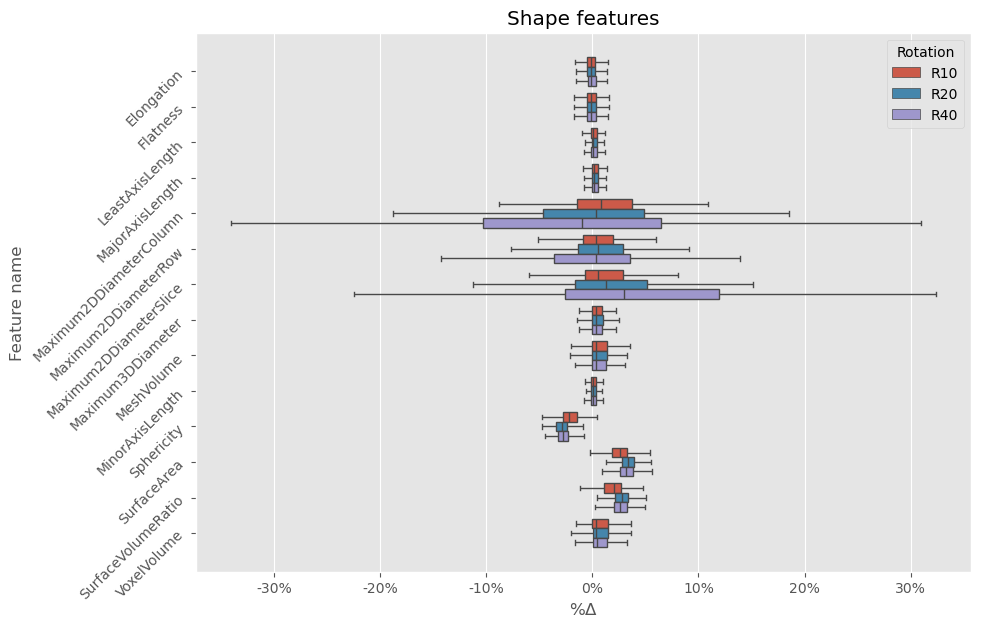

In [6]:
# Analyse shape features deviations before and after rotaions
df_shape = df_normed.loc['original', 'shape'].copy()
df_shape = df_shape.T.drop_duplicates(ignore_index=False, inplace=False, keep='last').T

def pct_change_with_R0(x: pd.DataFrame) -> pd.DataFrame:
    r"""This function calculates the percentage change between columns in a given DataFrame, 
    using the formula (b - a) / (a + 1E-14). It takes the first column as a reference and 
    calculates the percentage change for all other columns relative to it. The resulting 
    DataFrame has the same column names as the input DataFrame, except for the first column. 
    If any errors occur during the calculation, the function returns a copy of the input 
    DataFrame with all values set to missing (NA).
    
    Args:
        x (pd.DataFrame): Input data frame to be normalized
    
    Returns:
        pd.DataFrame: The standardized dataframe with multi-index column and index.
    
    """
    # display(x.columns)
    pairs = itertools.product([x.columns[0]], x.columns[1:])
    try:
        out_x = pd.concat([(x[b] - x[a]) / (x[a] + 1E-14) for a, b in pairs], axis=1)
            
        # reconstruct column names
        out_x.columns = x.columns[1:]
        out_x.columns = out_x.columns.droplevel([0, 1])
        out_x.columns.names = x.columns.names[2:]
    except:
        out_x = x.copy()
        out_x.iloc[:, :] = pd.NA
        out_x.columns = out_x.columns.droplevel([0, 1])
    return out_x

df_shape = df.loc['original', 'shape'].copy()
# * Drop duplicates if there's any
df_shape = df_shape.T.drop_duplicates(ignore_index=False, inplace=False, keep='last').T
df_shape.index = pd.MultiIndex.from_tuples([('original', 'shape', i) for i in df_shape.index], names=df.index.names)
display(df_shape)

# -- For each shape feature, display the histogram of percentage error
fig, ax = plt.subplots(1, 1, figsize=(10, 7), sharex=False)
_, shape_summary = plot_percentage_difference(df_shape, ax=ax, title = "Shape features")

# -- Also calculate the trend
trend_df = identify_trend_from_df(df)
sig_trend = trend_df.index[(trend_df['pval'] < .05)]

mdprint("## Summary of percentage changes")
display(shape_summary)

mdprint("## Spearman's test")
display(trend_df)

mdprint("## Plots of percentage differences")
plt.plot()


## What are the affects on Wavelet feature values and other imaging filters?

Unlike shape features, we expect changes of features derived from wavelet components will be great because the rotation likely disrupt the information distribution between each of the components. 

### Interpretation of the results

* glszm seems to be more unstable then other texture features across all imaging filters
* glcm seems to be more stable to rotations in general
* Most feature exhibit vairations between -15% to 15%
* 

## exponential

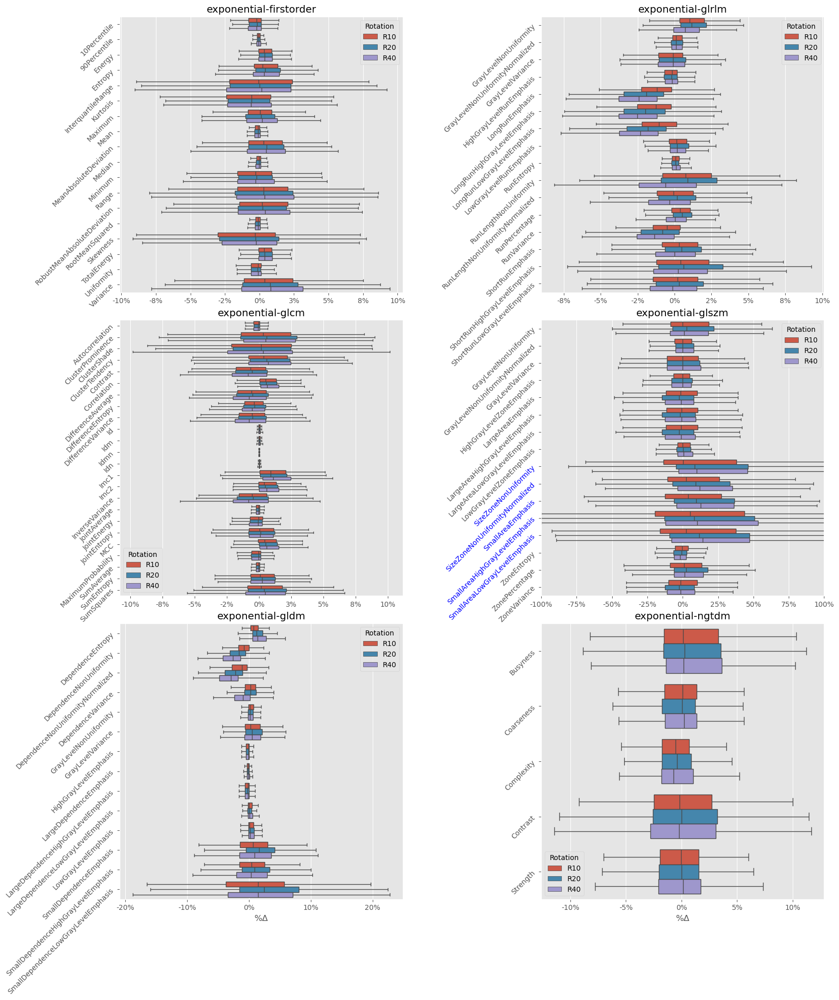

## gradient

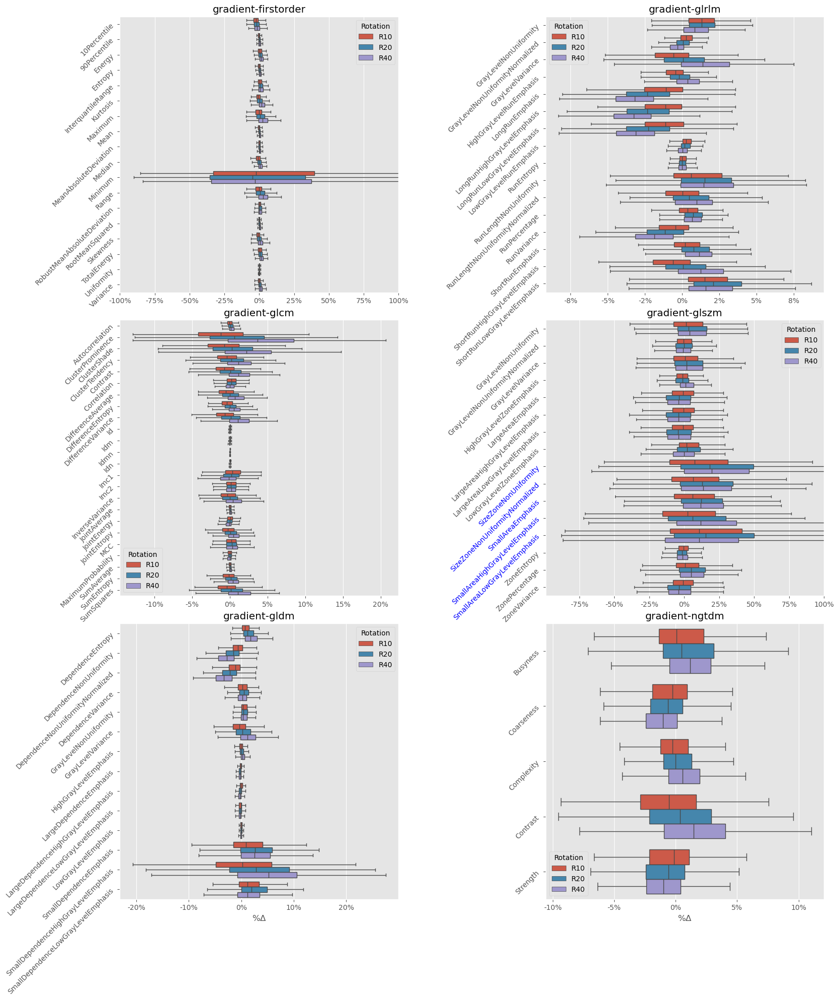

## lbp-3D-k

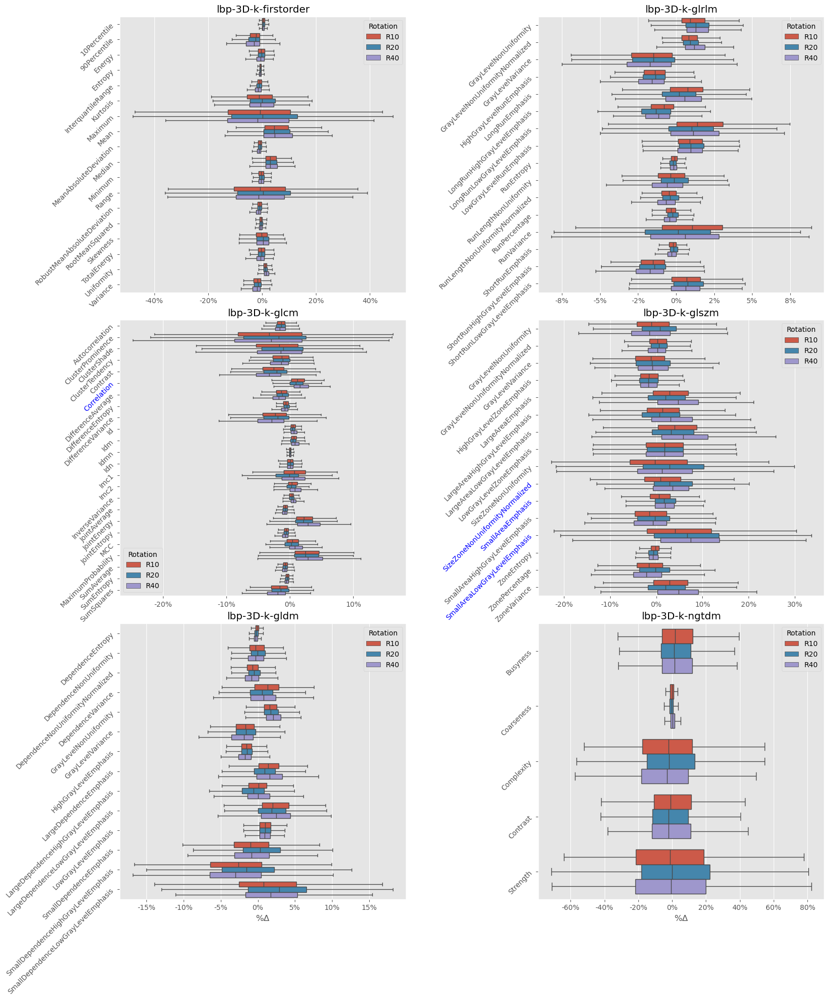

## lbp-3D-m1

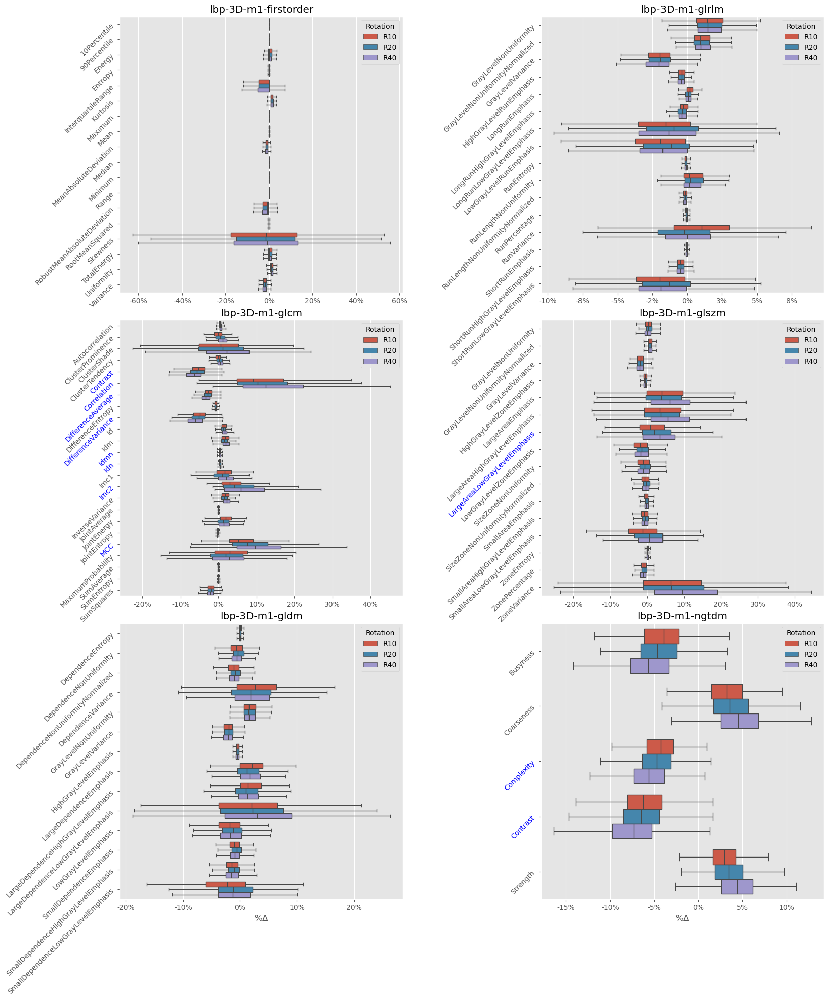

## lbp-3D-m2

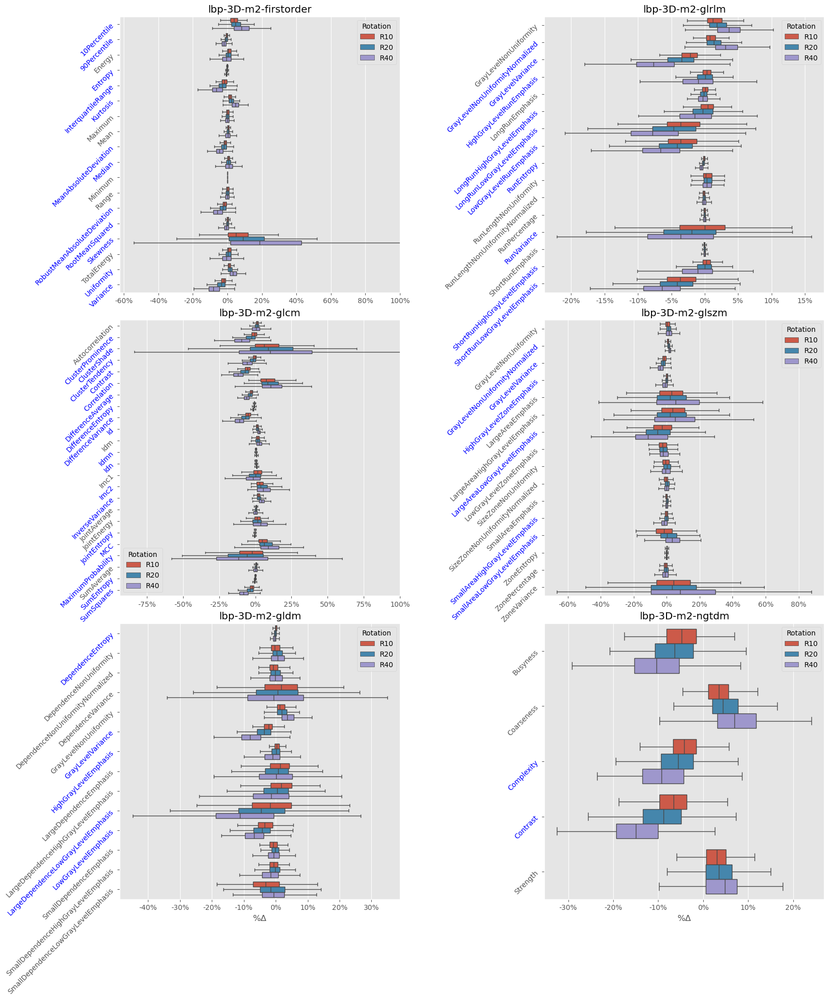

## log-sigma-0-9765625-mm-3D

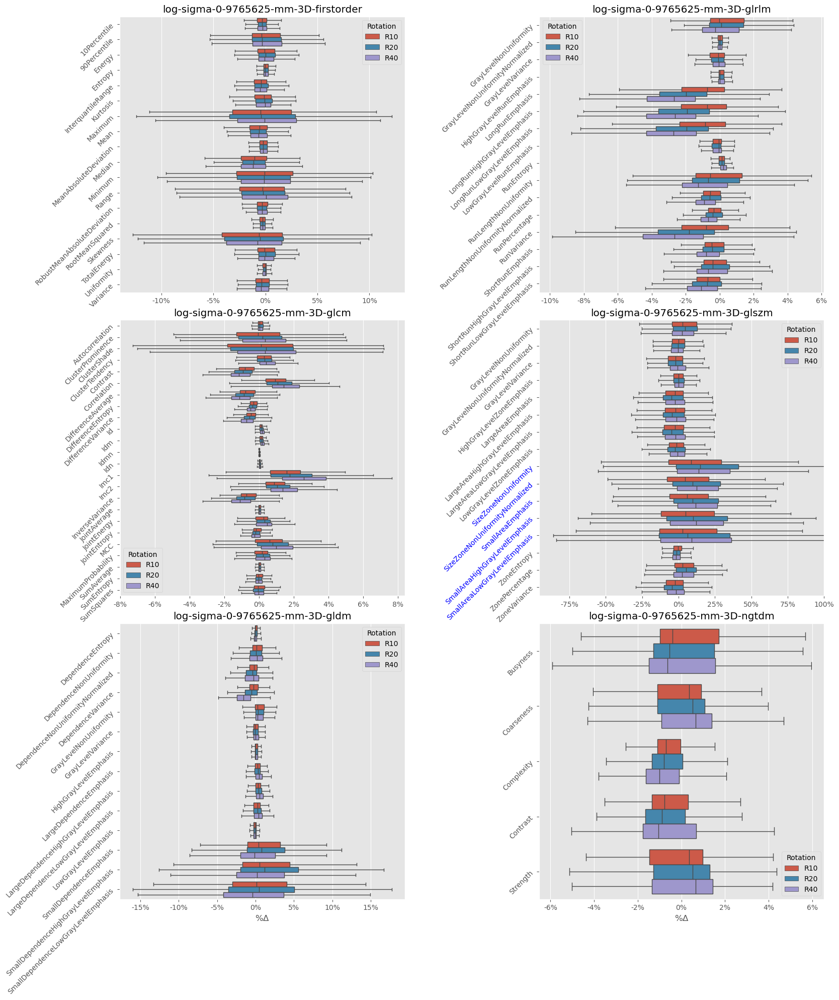

## logarithm

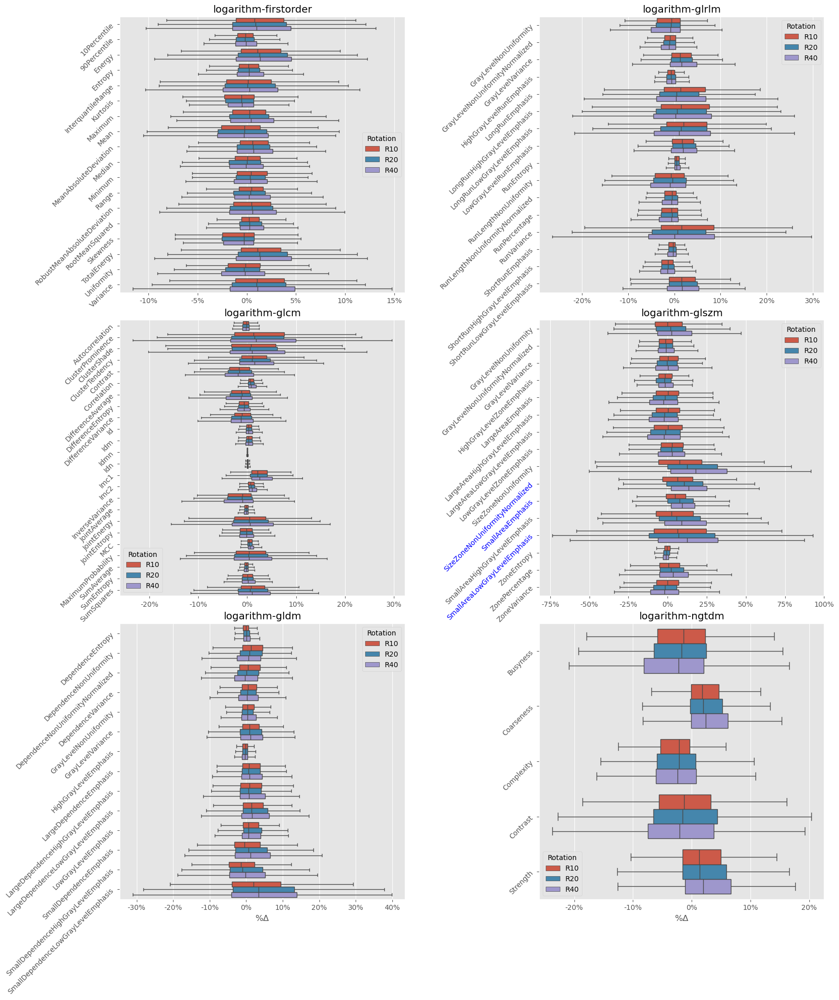

## original

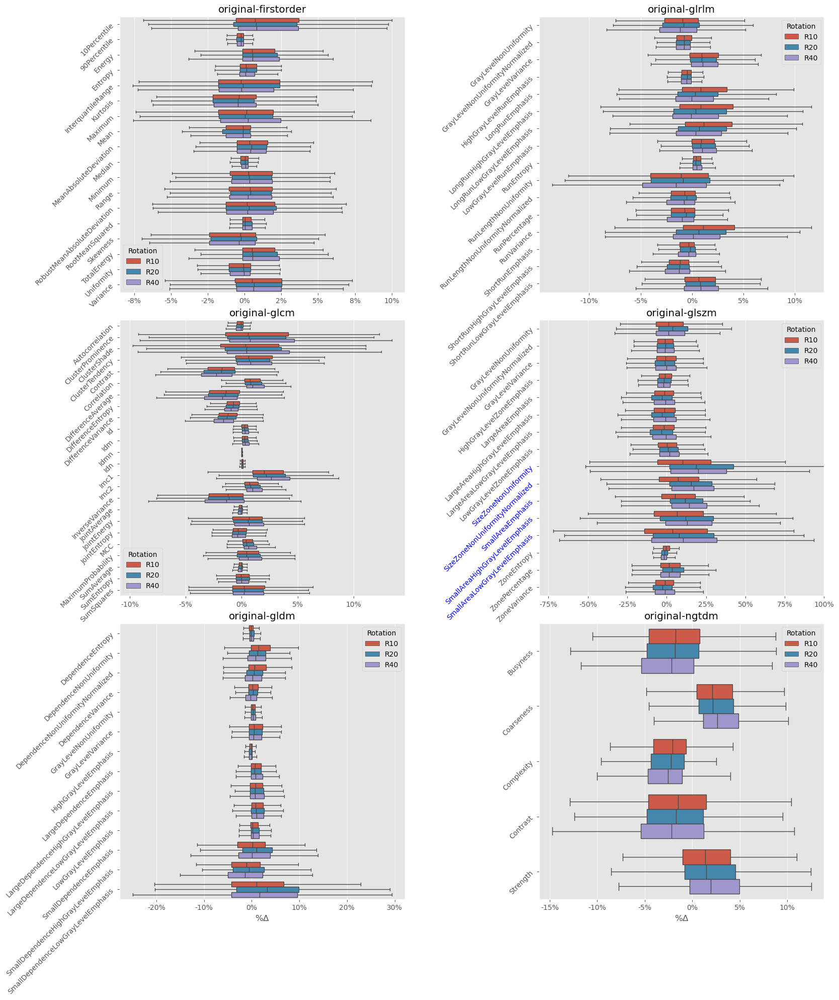

## square

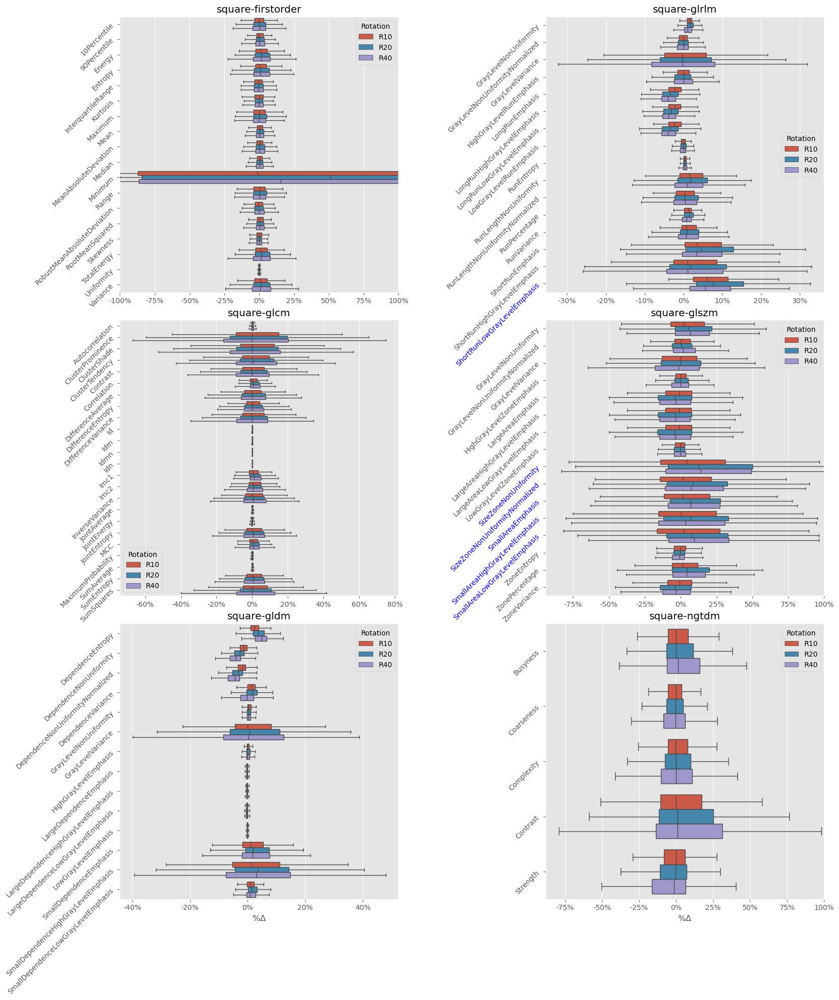

## squareroot

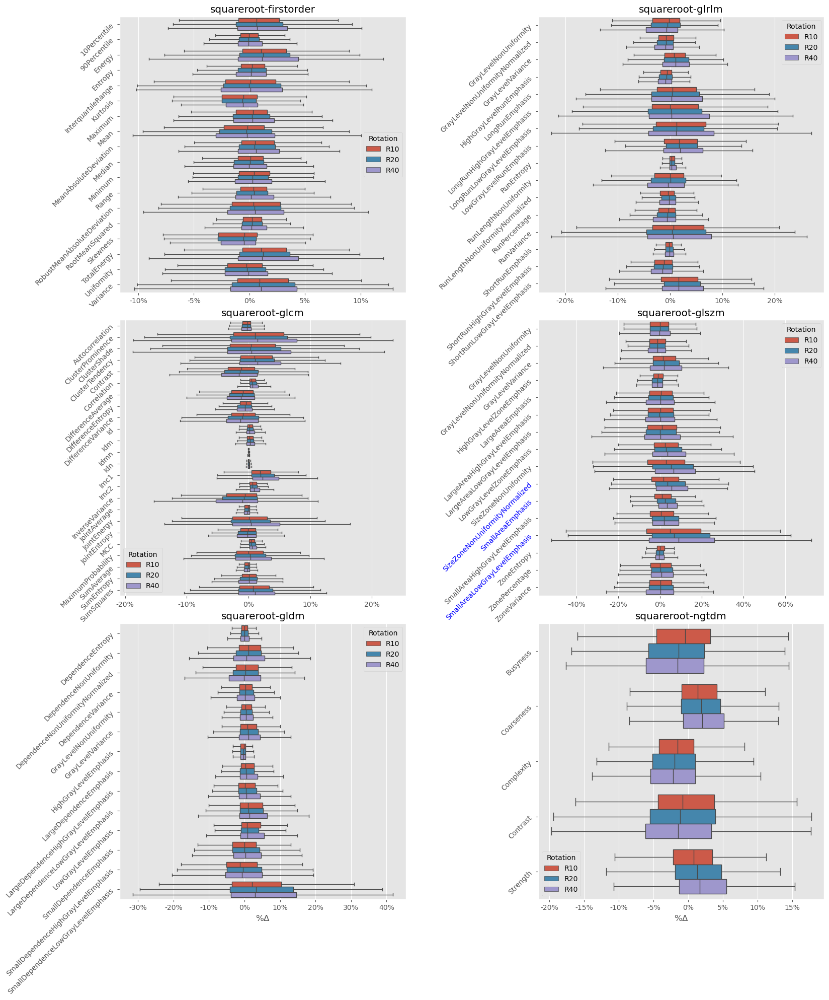

## wavelet-HHH

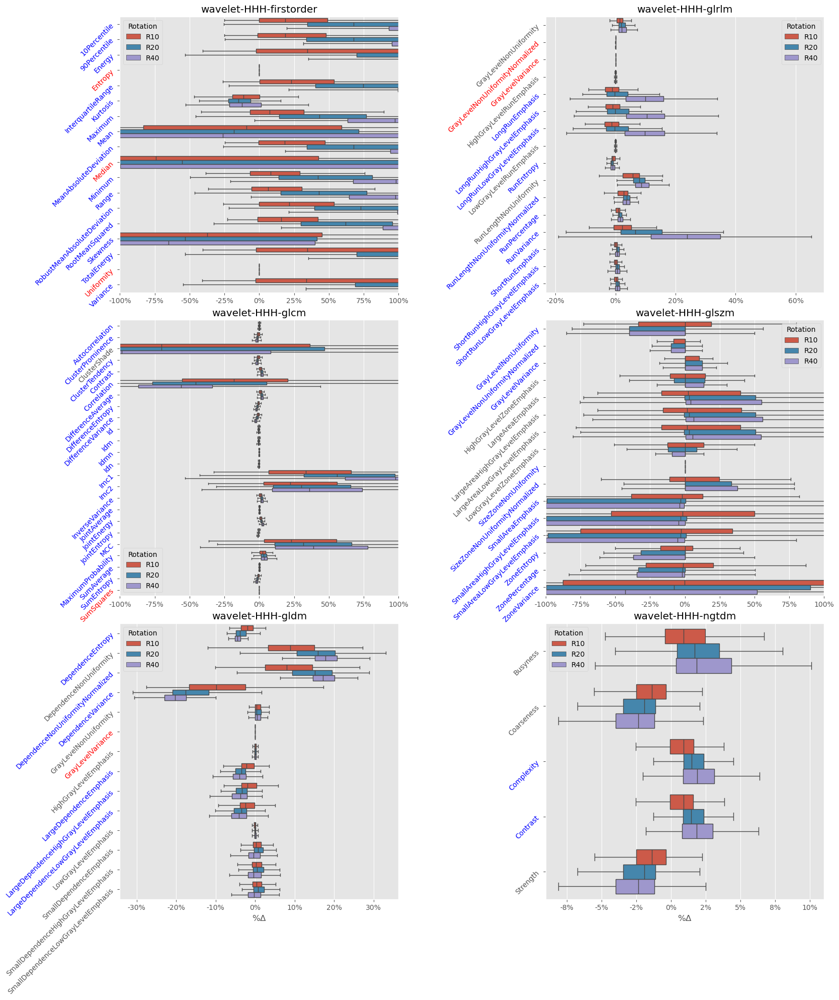

## wavelet-HHL

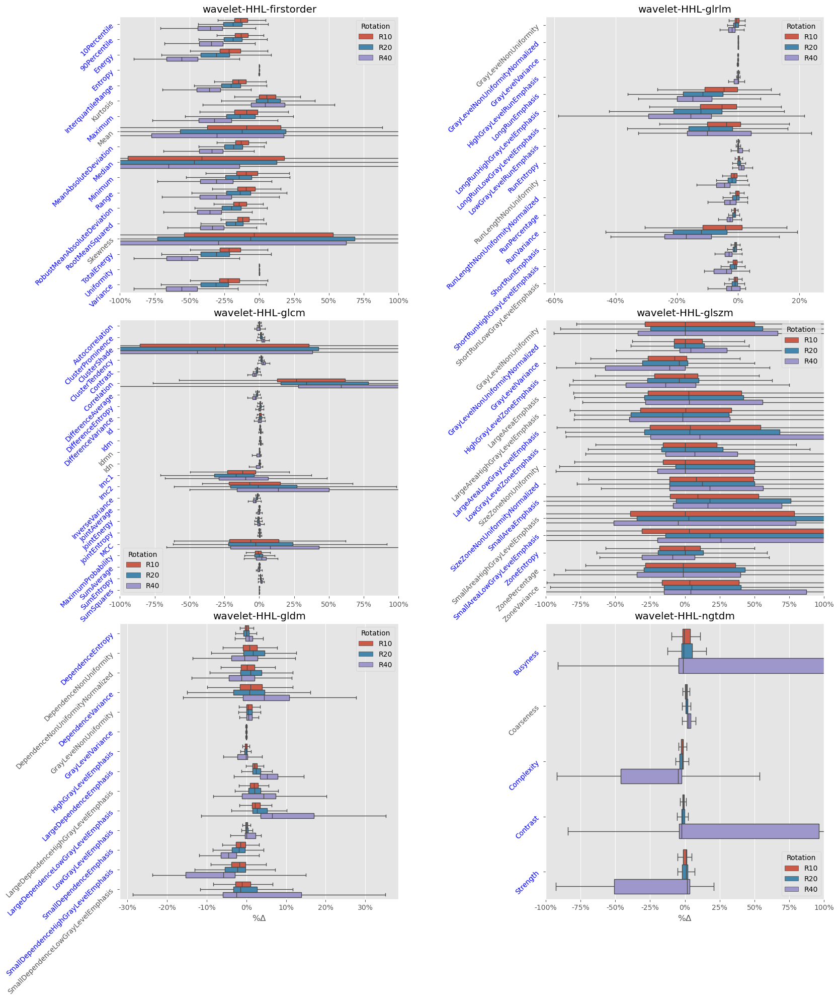

## wavelet-HLH

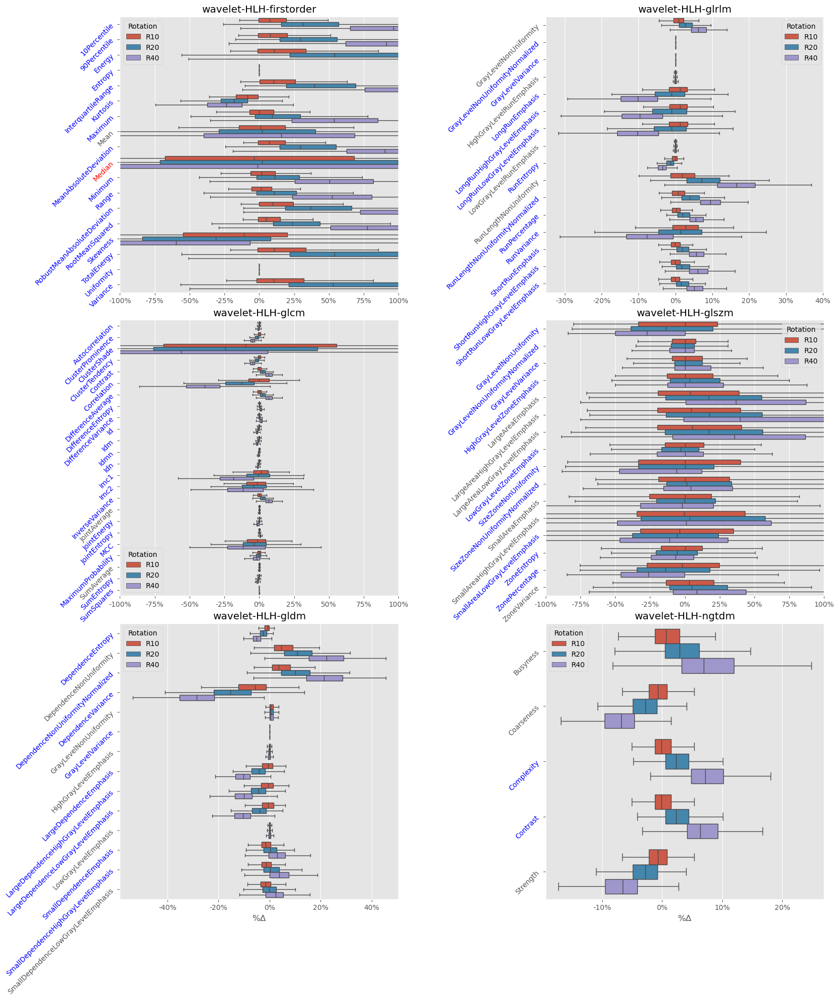

## wavelet-HLL

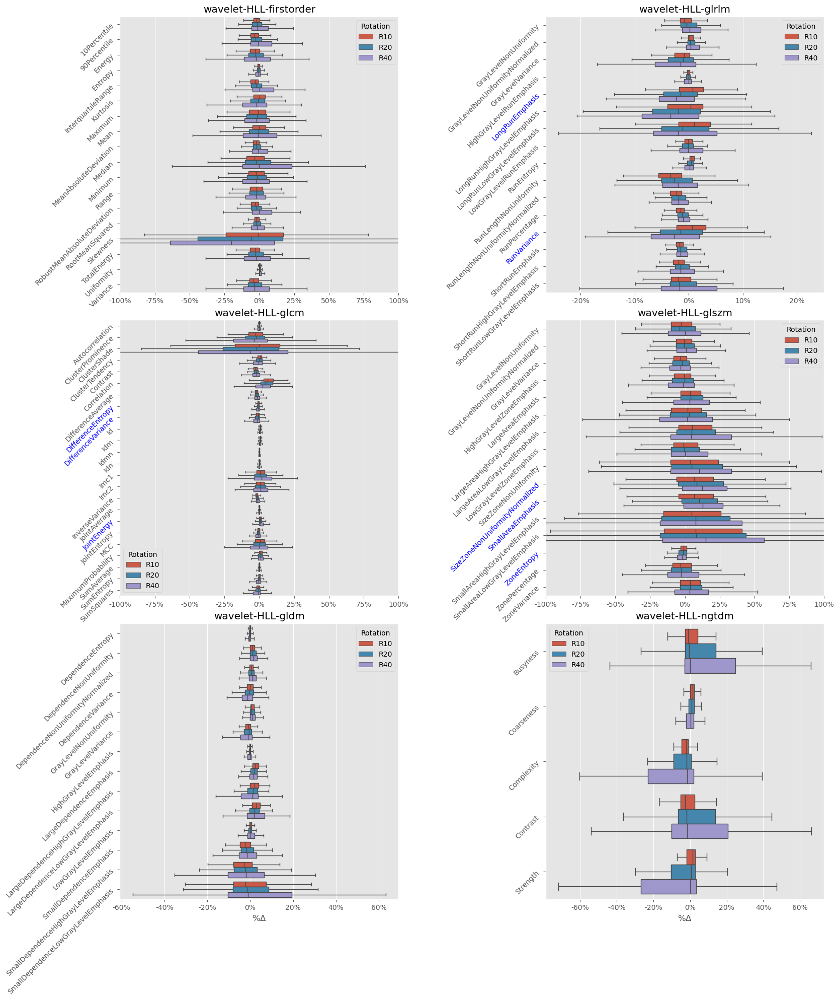

## wavelet-LHH

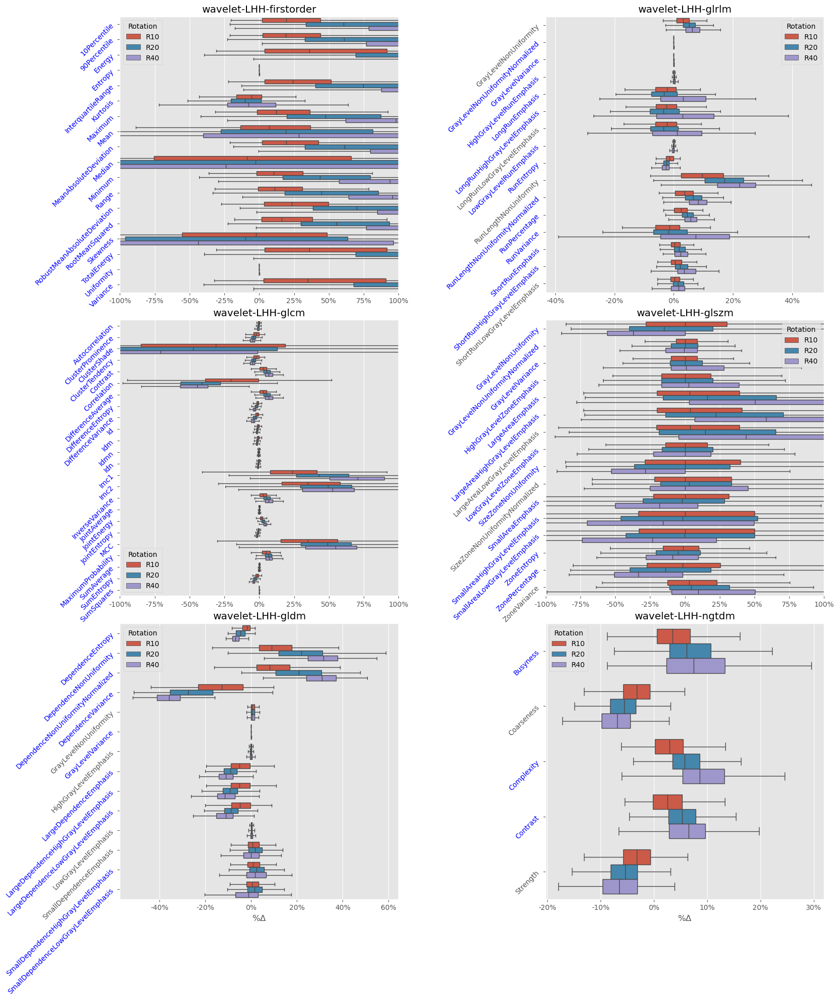

## wavelet-LHL

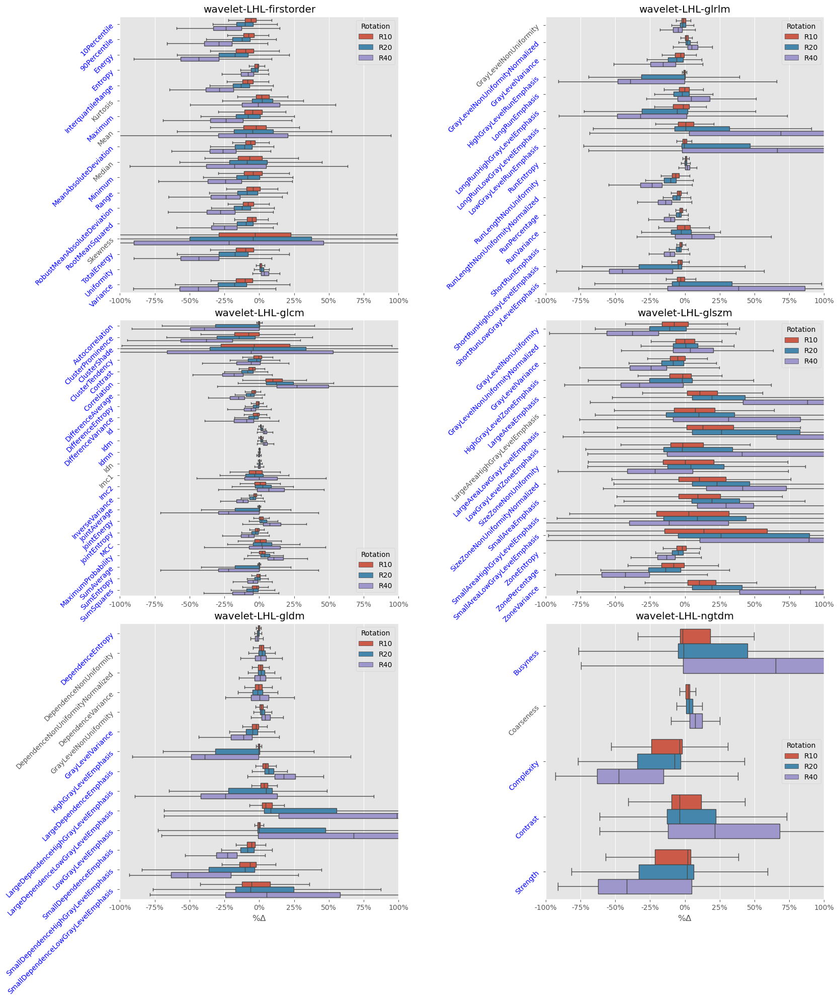

## wavelet-LLH

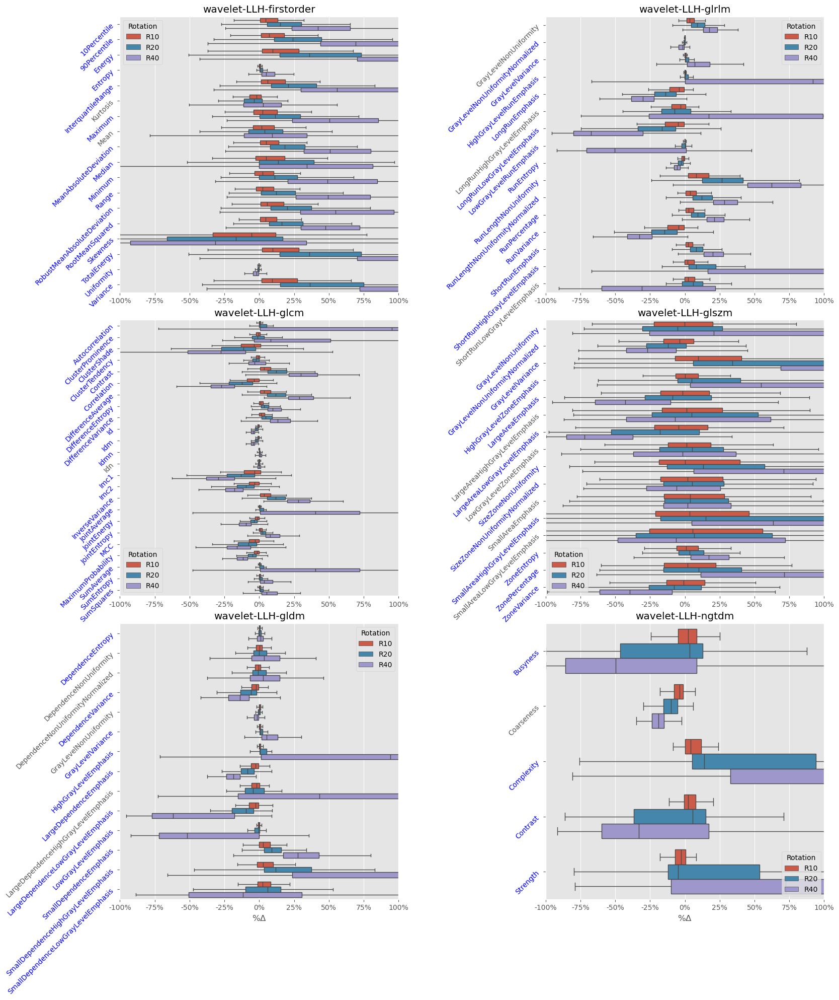

## wavelet-LLL

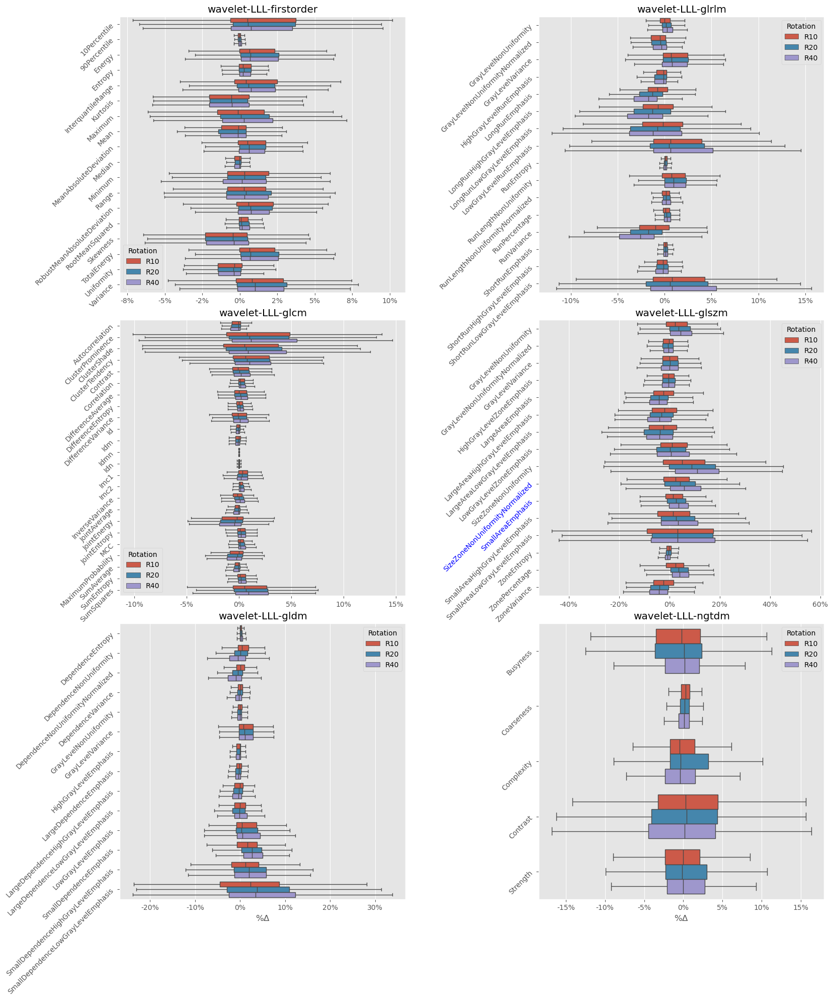

Median        LQ        HQ  \
ImagingFilter Category   Name         Rotation                                 
exponential   firstorder 10Percentile R10      -0.002086 -0.007811  0.001005   
                                      R20      -0.001837 -0.007578  0.001049   
                                      R40      -0.001970 -0.008415  0.000993   
                         90Percentile R10      -0.000640 -0.001881  0.000286   
                                      R20      -0.000643 -0.001874  0.000460   
...                                                  ...       ...       ...   
wavelet-LLL   ngtdm      Contrast     R20       0.004197 -0.040366  0.043303   
                                      R40       0.001773 -0.044561  0.040903   
                         Strength     R10       0.000014 -0.023491  0.020889   
                                      R20      -0.001416 -0.022457  0.030229   
                                      R40      -0.000268 -0.020517  0.027672   

                                                is_filtered_by_var_thres  \
ImagingFilter Category   Name         Rotation                             
exponential   firstorder 10Percentile R10                          False   
                                      R20                          False   
                                      R40                          False   
                         90Percentile R10                          False   
                                      R20                          False   
...                                                                  ...   
wavelet-LLL   ngtdm      Contrast     R20                          False   
                                      R40                          False   
                         Strength     R10                          False   
                                      R20                          False   
                                      R40                          False   

                                                is_spearmans_trend_significant  
ImagingFilter Category   Name         Rotation                                  
exponential   firstorder 10Percentile R10                                False  
                                      R20                                False  
                                      R40                                False  
                         90Percentile R10                                False  
                                      R20                                False  
...                                                                        ...  
wavelet-LLL   ngtdm      Contrast     R20                                False  
                                      R40                                False  
                         Strength     R10                                False  
                                      R20                                False  
                                      R40                                False  

[5022 rows x 5 columns]

In [7]:
summary_df = []
plt.close('all')
for wf in df.index.get_level_values(0).unique():
    mdprint(f"## {wf}")
    df_wf = df.loc[wf]
    feature_cat = df_wf.index.get_level_values(0).unique()
    
    # For each feature category
    fig, ax = plt.subplots(len(feature_cat) // 2, 2, figsize=(14, 20))
    for i, cat in enumerate(feature_cat):
        # Skip shape because its already analyzed
        if cat == 'shape': 
            continue

        # find out which features has zero variances
        var_thres = VarianceThreshold(threshold=1E-6)
        var_thres.fit(df_wf.loc[cat].T)
        v_low = df_wf.loc[cat].index[~var_thres.get_support()]
        display_df = df_wf.loc[cat].loc[v_low]

        # identify where to plot
        ax_y, ax_x = i % (len(feature_cat) // 2), i // (len(feature_cat) // 2)
        _ax: plt.Axes = ax[ax_y][ax_x]
        
        # reconstruct the index
        _df_cat = df_wf.loc[cat]
        _df_cat.index = pd.MultiIndex.from_tuples([(wf, cat, n) for n in _df_cat.index], names=df.index.names)
        
        # plot and calculate the percentage differences
        _, _cat_summary = plot_percentage_difference(_df_cat, ax=_ax, title=f"{wf}-{cat}")
        _cat_summary['is_filtered_by_var_thres'] = [a in v_low for a in _cat_summary.index.get_level_values(2)]
        # note that _cat_summary has rotation as index level 4 
        _cat_summary['is_spearmans_trend_significant'] = [a[:3] in sig_trend for a in _cat_summary.index] 

        # reconstruct the labels with respect to their properties        
        yticklabels = _ax.get_yticklabels()
        for ylab in yticklabels:
            # highlight the ylabels that are marked with *
            _feat_name = ylab.get_text()
            if _feat_name in v_low:
                ylab.set_color("red")
                ylab.set_label(f"{ylab.get_text()}*")
            if (wf, cat, _feat_name) in sig_trend:
                ylab.set_color("blue")
                ylab.set_label(f"{ylab.get_text()}^")
        
        summary_df.append(_cat_summary)
        
        # Only show the x label for the last two diagrams
        _ax.set_ylabel(None)
        if ax_y != len(feature_cat) // 2 - 1:
            _ax.set_xlabel(None)
    fig.tight_layout()
    fig.subplots_adjust(left=0, right=1, hspace=0.1)
    plt.show()
summary_df = pd.concat(summary_df)
display(summary_df)

# Radiomisc analysis

```mermaid
flowchart LR
    feat[(Features)]  
    discard[/Discard/]
    subgraph "fs"["Preliminary Feature Selection"]
        var_thres(Variance Treshold) --> |"p < 0.05"|anova(ANOVA)
        var_thres --> |otherwise|discard
        anova --> |otherwise|discard
    end
    subgraph "supfs"["Supervised Feature Selection"]
        lasso(LASSO)
        enet(Elastic Net)
        ridge(Ridge)
    end
    feat --> var_thres
    anova ---> |"p < 0.05"|lasso & enet & ridge
```

In [8]:
import numpy as np
import scipy.stats

def mean_confidence_interval(data, confidence=0.95):
    a = 1.0 * np.array(data).astype('float')
    n = len(a)
    m, se = np.mean(a), scipy.stats.sem(a)
    h = se * scipy.stats.t.ppf((1 + confidence) / 2., n-1)
    out = pd.Series([m, m-h, m+h], index=['Mean', 'Lower', 'Upper'], name=f"{confidence * 100:.0f}% CI")
    return out

def get_CI_table(data: pd.DataFrame, group_levels: List):
    CI_table = data.groupby(level=group_levels).apply(mean_confidence_interval).reset_index(level=-1)
    CI_table = CI_table.pivot(
        columns=[CI_table.columns[0]]
    )

    # drop column levels for convinience
    CI_table = CI_table.T.reset_index(drop=True).T
    # note that the order is mixed because the transform re-sorted 'Mean', 'Lower', 'Upper' -> 'Lower', 'Mean', 'Upper'
    CI_out = CI_table.T.apply(lambda a: f"{a[1] * 100:.01f}% ({a[0] * 100:.01f}%-{a[2] * 100:.01f}%)").to_frame()
    return CI_out

def get_count_table(data: pd.DataFrame, group_levels: List):
    # Counts of features, // 4 because there are 4 rotations
    counting_var = data.groupby(level=group_levels)[['is_filtered_by_var_thres']].value_counts().to_frame() // 3
    counting_spearmans = data.groupby(level=group_levels)[['is_spearmans_trend_significant']].value_counts().to_frame() // 3
    var_thres_count_col = counting_var.reset_index(level=-1).pivot(
        columns='is_filtered_by_var_thres', values='count'
    ).apply(
        lambda a: f"{a.fillna(0)[True] / float(a.fillna(0)[True] + a[False]) * 100:.02f}% ({int(a.fillna(0)[True]):d}/{int(a.fillna(0)[True] + a[False]):d})", 
        axis=1
    )
    spearmans_sig_count_col = counting_spearmans.reset_index(level=-1).pivot(
        columns='is_spearmans_trend_significant', values='count'
    ).apply(
        lambda a: f"{a.fillna(0)[True] / float(a.fillna(0)[True] + a[False]) * 100:.02f}% ({int(a.fillna(0)[True]):d}/{int(a.fillna(0)[True] + a[False]):d})", 
        axis=1
    ).to_frame()
    summary_display_df = pd.concat([var_thres_count_col, spearmans_sig_count_col], axis=1)
    summary_display_df.columns = ['Var Thres Filtered Out', 'Spearmans Filtered Out']
    return summary_display_df

# Calculate interquartile raage
summary_df_p = summary_df.copy()
summary_df_p['IQR'] = summary_df['HQ'] - summary_df['LQ']
# Separately consider wavelet features and non-wavelet features
summary_df_p['is_wavelet'] = [i.find("wavelet") >= 0 for i in summary_df_p.index.get_level_values(0)]
summary_df_p.set_index('is_wavelet', append=True, drop=True, inplace=True)
summary_grouped_by_category = summary_df_p.groupby(level=[-1, 1]).mean().applymap(lambda x: "{:.1%}".format(x))
summary_grouped_by_filter = summary_df_p.groupby(level=[-1, 0]).mean().applymap(lambda x: "{:.1%}".format(x))
# calculate 95% confidence intervals for median and IQR
filter_IQR_CI = get_CI_table(summary_df_p['IQR'], [-1, 0])
filter_IQR_CI.columns = ['IQR']
filter_Med_CI = get_CI_table(summary_df_p['Median'], [-1, 0])
filter_Med_CI.columns = ['Median']

category_IQR_CI = get_CI_table(summary_df_p['IQR'], [-1, 1])
category_IQR_CI.columns = ['IQR']
category_Med_CI = get_CI_table(summary_df_p['Median'], [-1, 1])
category_Med_CI.columns = ['Median']


mdprint("### Grouped by Imaging filter")
display(HTML(filter_IQR_CI.to_html()))
display(HTML(filter_Med_CI.to_html()))
display(get_CI_table(summary_df_p['IQR'], [-1]))
filter_summary_display_df = get_count_table(summary_df_p, [-1, 0])
display(HTML(filter_summary_display_df.to_html()))

mdprint("### Grouped by category")
display(HTML(category_IQR_CI.to_html()))
display(HTML(category_Med_CI.to_html()))

category_summary_display_df = get_count_table(summary_df_p, [-1, 1])
display(HTML(category_summary_display_df.to_html()))

### Grouped by Imaging filter

,0
is_wavelet,
False,7.3% (5.8%-8.8%)
True,24.1% (22.3%-25.9%)


### Grouped by category

### IQR plot

### Spearman's test plot

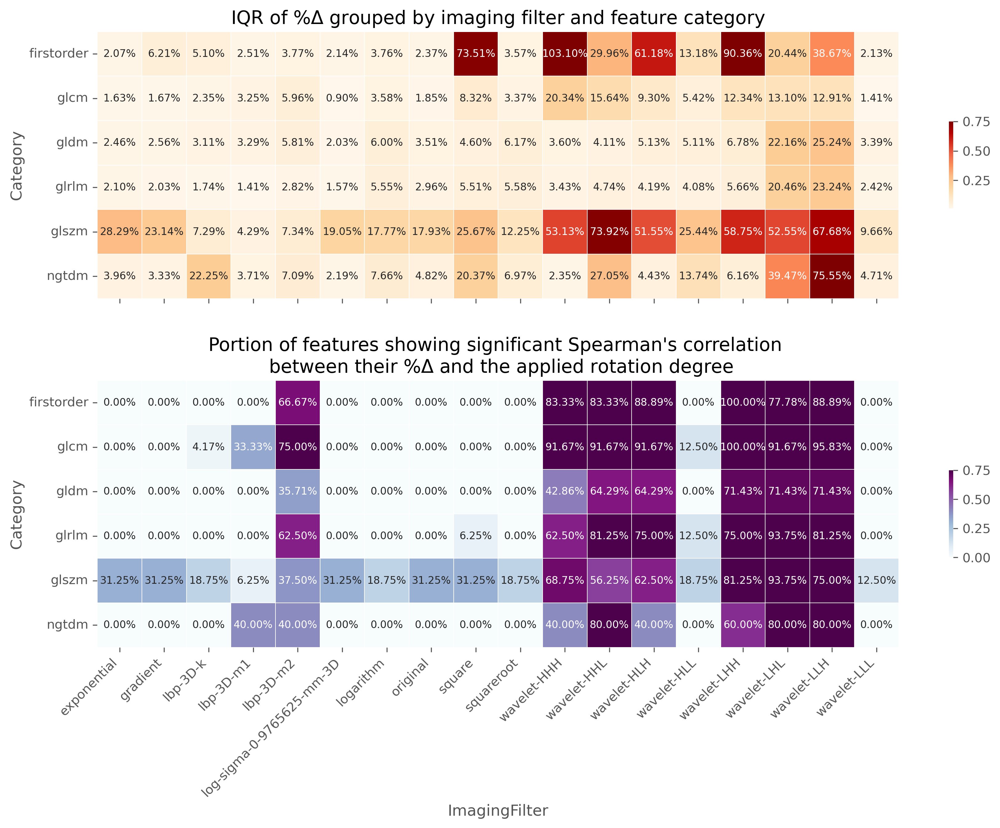

In [9]:

# pivot the table for displaying a heat map for IQR
mdprint("### IQR plot")
heat_map = summary_df_p.reset_index().pivot(index="ImagingFilter", columns=["Category", "Name", "Rotation"], values="IQR").groupby(axis=1, level=0).mean()

fig, ax = plt.subplots(2, 1, figsize=(14, 9), sharex=True, dpi=300)
sns.heatmap(heat_map.T, vmax=.75, square=True, cmap='OrRd', cbar_kws={"shrink": .3}, annot=True, annot_kws={"fontsize": 8}, fmt='.2%', linewidths=0.1, ax=ax[0])
ax[0].set_yticklabels(ax[0].get_yticklabels(), rotation=0)
ax[0].set_title("IQR of $\%\Delta$ grouped by imaging filter and feature category")
ax[0].set_xlabel(None)

# pivot the table for displaying a heat map for % of features that showed significant Spearman's test
mdprint("### Spearman's test plot")
heat_map = summary_df_p.reset_index().pivot(index="ImagingFilter", columns=["Category", "Name", "Rotation"], values="is_spearmans_trend_significant").groupby(axis=1, level=0).mean()

sns.heatmap(heat_map.T, vmax=.75, square=True, cmap='BuPu', cbar_kws={"shrink": .3}, annot=True, annot_kws={"fontsize": 8}, fmt='.2%', linewidths=0.1, ax=ax[1])
ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation=45, ha='right')
ax[1].set_yticklabels(ax[1].get_yticklabels(), rotation=0)
ax[1].set_title("Portion of features showing significant Spearman's correlation \n between their $\%\Delta$ and the applied rotation degree")
# fig.tight_layout(h_pad=1, rect=[0, 0, 0.8, 1])
plt.show()

# Plot for IQR %$\Delta$ 

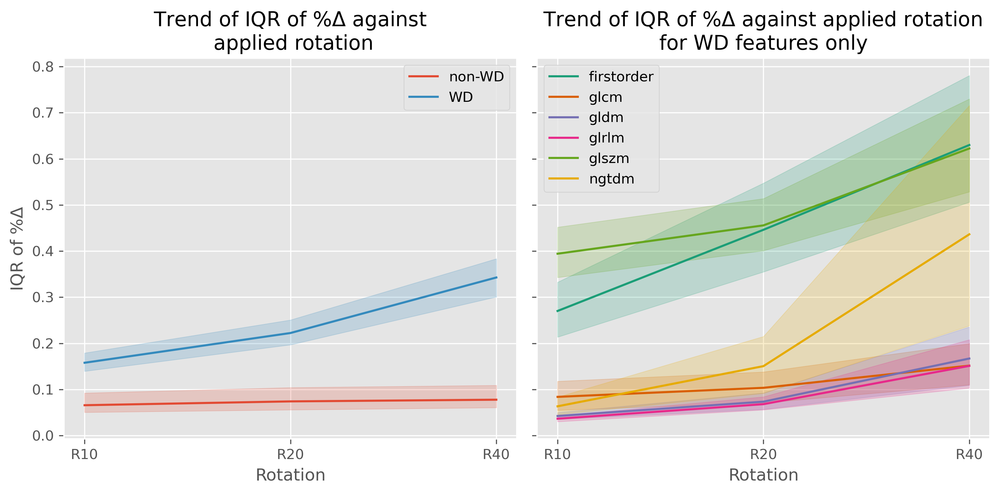

In [18]:
# Show the performance
fig, ax = plt.subplots(1, 2, figsize=(10, 5), sharey=True, dpi=300)
sns.lineplot(summary_df_p['IQR'].to_frame(), x='Rotation', y='IQR', hue='is_wavelet', ax=ax[0])
sns.lineplot(summary_df_p['IQR'].swaplevel(0, -1).loc[True].to_frame(), x='Rotation', y='IQR', hue='Category', palette='Dark2', ax=ax[1])
ax[0].set_ylabel("IQR of $\%\Delta$")
l = ax[0].legend()
l.get_texts()[0].set_text("non-WD")
l.get_texts()[1].set_text("WD")
ax[0].set_title("Trend of IQR of $\%\Delta$ against \n applied rotation")
ax[1].set_title("Trend of IQR of $\%\Delta$ against applied rotation \nfor WD features only")
l = ax[1].legend()
fig.tight_layout()


# Tables

In [11]:
mdprint("## IQR of %$\Delta$ ")
table_df = summary_df_p.copy()
table_df['Feature Category'] = table_df.index.get_level_values(0).to_series().apply(lambda x: "WD" if x.find("wavelet") >= 0 else "non-WD").values
table_df.set_index("Feature Category", append=True, inplace=True)

display(table_df.groupby(['Feature Category', 'Rotation', ])['IQR'].mean().apply(lambda x: f"{x * 100: .2f}%").to_frame())

## IQR of %$\Delta$ 

IQR
Feature Category Rotation         
WD               R10        15.79%
                 R20        22.24%
                 R40        34.28%
non-WD           R10         6.59%
                 R20         7.42%
                 R40         7.78%

In [22]:
# percentabe_table = table_df.reset_index().pivot(index="ImagingFilter", columns=["Category", "Feature Category", "Name", "Rotation"], values="is_spearmans_trend_significant")
display(table_df.groupby(["Feature Category"])['is_spearmans_trend_significant'].sum() / table_df.groupby(["Feature Category"])['is_spearmans_trend_significant'].count())

Feature Category
WD        0.614247
non-WD    0.107527
Name: is_spearmans_trend_significant, dtype: float64

display(table_df)